In [1]:
# -- uncomment the following lines to install the required packages
# !pip install openpyxl pandas
# !pip install folium
# !pip install matplotlib
# !pip install geopy

### Download POGOH Dataset

In [2]:
# https://data.wprdc.org/dataset/pogoh-trip-data
dataset_links = [
    "/f5acbde3-61c8-4ae1-97b1-5ece93b39abc/download/october-2024.xlsx",
    "/08b45a0d-74ea-4b41-a372-0cec15085dd4/download/september-2024.xlsx",
    "/8cefdd14-84a2-4b1b-a53c-8011c5661a4c/download/august-2024.xlsx",
    "/a56ccfb5-414e-4760-8133-65f79ea5d94f/download/july-2024.xlsx",
    "/a05520d3-cdf1-4b52-aa47-238731c1c32c/download/june-2024.xlsx",
    "/a4598299-e02a-43a3-901f-dff08630e96e/download/may-2024.xlsx",
    "/0814f43e-bf31-4efd-a2d6-ab48402106d4/download/april-2024.xlsx",
    "/01a59873-8f16-428d-a77c-adbc7c86edb8/download/march-2024.xlsx",
    "/a4f35db1-f120-45ea-a6ee-353e65ce766c/download/february-2024.xlsx",
    "/79e585fd-c139-4eb2-9cc9-5b72de6803de/download/january-2024.xlsx",
    "/b006e671-5661-4b9c-8eca-1351598804c1/download/december-2023.xlsx",
    "/4574cdf1-e65a-42df-8ede-eadd4548660a/download/november-2023.xlsx",
    "/a82c7c20-2c88-4de6-a3db-da1b4d64fe13/download/october-2023.xlsx",
    "/f1ba1ba5-f4f0-449e-af37-36d021ea7223/download/september-2023.xlsx",
    "/e4f6d854-e40a-4f16-8bdf-255c912b4cfd/download/august-2023.xlsx",
    "/e2c446b7-b0f5-43d5-87ac-f4b252f27aa3/download/july-2023.xlsx",
    "/a6bde28d-e11b-4854-b3b0-d4a851f6ee3a/download/june-2023.xlsx",
    "/78ec9f4b-f99e-4995-8a20-2a1e075d63db/download/may-2023.xlsx",
    "/8e8a5cd9-943e-4d21-a7ed-05f865dd0038/download/apr-2023.xlsx",
    "/49bd4cba-5361-4375-a789-210dd4f7903b/download/march-2023.xlsx",
    "/cfd4c472-d019-4f25-87ab-4fad1936f127/download/february-2023.xlsx",
    "/b486bf17-5fa0-4311-b256-9fb354f0f827/download/january-2023.xlsx",
    "/f3c25fad-372b-4ded-9aab-2f7ae75b9008/download/december-2022.xlsx",
    "/97ba8ceb-a39b-49a1-a7fb-b26aca69c0f4/download/november-2022.xlsx",
    "/5b44e019-5480-4dcc-aac3-a5f6a624ee53/download/october-2022.xlsx",
    "/1688f127-e894-4134-ac91-342c988a772c/download/september-2022.xlsx",
    "/115f1654-9757-4705-9ca2-9e8573b3012a/download/august-2022.xlsx",
    "/1744cd4a-13cf-46de-b773-57f528ee9705/download/july-2022.xlsx",
    "/6ab3626b-b640-41b7-aed8-f3359495a695/download/june-2022.xlsx",
    "/2cd57068-5498-4b47-b2d3-512d3cdb1e0c/download/may-2022.xlsx",
]

import os
import requests
import shutil

if not os.path.exists("./datasets"):
    os.makedirs("./datasets")
    
for link in dataset_links:
    filename = link.split("/")[-1]
    
    if os.path.exists(f"./datasets/{filename}"):
        print(f"alraedy exists: skipping {link}")
        continue
    
    print(f"downloading {link}")
    response = requests.get(f'https://data.wprdc.org/dataset/f376ccbc-c851-4b58-8b59-5dd9edc736ee/resource{link}', stream=True)
    with open(f"./datasets/{filename}", "wb") as out_file:
        shutil.copyfileobj(response.raw, out_file)
    del response

alraedy exists: skipping /f5acbde3-61c8-4ae1-97b1-5ece93b39abc/download/october-2024.xlsx
alraedy exists: skipping /08b45a0d-74ea-4b41-a372-0cec15085dd4/download/september-2024.xlsx
alraedy exists: skipping /8cefdd14-84a2-4b1b-a53c-8011c5661a4c/download/august-2024.xlsx
alraedy exists: skipping /a56ccfb5-414e-4760-8133-65f79ea5d94f/download/july-2024.xlsx
alraedy exists: skipping /a05520d3-cdf1-4b52-aa47-238731c1c32c/download/june-2024.xlsx
alraedy exists: skipping /a4598299-e02a-43a3-901f-dff08630e96e/download/may-2024.xlsx
alraedy exists: skipping /0814f43e-bf31-4efd-a2d6-ab48402106d4/download/april-2024.xlsx
alraedy exists: skipping /01a59873-8f16-428d-a77c-adbc7c86edb8/download/march-2024.xlsx
alraedy exists: skipping /a4f35db1-f120-45ea-a6ee-353e65ce766c/download/february-2024.xlsx
alraedy exists: skipping /79e585fd-c139-4eb2-9cc9-5b72de6803de/download/january-2024.xlsx
alraedy exists: skipping /b006e671-5661-4b9c-8eca-1351598804c1/download/december-2023.xlsx
alraedy exists: skipp

Fix 'Start Date' and 'End Date' columns as they have inconsistent formats. 

In [3]:
import re
import pandas as pd

def transform_date_col(val):
    pattern = r'[A-Za-z]{3}, [A-Za-z]{3} \d{2}, \d{4}, \d{2}:\d{2} (AM|PM)' # Sun, Apr 30, 2023, 11:59 PM
    return pd.to_datetime(val, format='%a, %b %d, %Y, %I:%M %p') if type(val) == str and re.match(pattern, val) else val

for link in dataset_links:
    filename = link.split("/")[-1]
    if os.path.exists(f"./datasets/{filename}.datefixed"):
        continue
    print(f"fixing start/end date format: {filename}")
    trips_df = pd.read_excel(f"./datasets/{filename}")
    trips_df['Start Date'] = trips_df['Start Date'].apply(transform_date_col)
    trips_df['End Date'] = trips_df['End Date'].apply(transform_date_col)
    trips_df.to_excel(f"./datasets/{filename}", index=False)
    open(f"./datasets/{filename}.datefixed", "w").close()

### Merge datasets file into a single CSV file.

In [4]:
# merge all datasets into one csv file
import pandas as pd

if not os.path.exists("pogoh-trip-data.csv"):
    merged = pd.DataFrame()
    for link in dataset_links:
        filename = link.split("/")[-1]
        print(f"loading {filename}")
        trips_df = pd.read_excel(f"./datasets/{filename}")
        merged = pd.concat([merged, trips_df])
    
    merged.rename(columns={
        'Closed Status': 'closed_status',
        'Duration': 'duration',
        'Start Station Id': 'start_station_id',
        'Start Date': 'start_date',
        'Start Station Name': 'start_station_name',
        'End Date': 'end_date',
        'End Station Id': 'end_station_id',
        'End Station Name': 'end_station_name',
        'Rider Type': 'rider_type',
    }, inplace=True)
    
    # fix station names inconsistencies
    for old, new in { "Liberty & Stanwix": "Liberty Ave & Stanwix St",
                      "S 27th St & Sidney St. (Southside Works": "S 27th St & Sidney St. (Southside Works)",
                      "Burns white at 3 crossings": "Burns White Center at 3 Crossings",
                      "Eliza Furnace Trail at Swineburne St": "Eliza Furnace Trail & Swineburne St",
                      "North Shore Trail": "North Shore Trail & Fort Duquesne Bridge",
                      "Penn Ave & S Whitfield": "Penn Ave & S Whitfield St" }.items():
        merged['start_station_name'] = merged['start_station_name'].replace(old, new)
        merged['end_station_name'] = merged['end_station_name'].replace(old, new)
        
    # drop na station names
    merged.dropna(subset=['start_station_name', 'end_station_name'], inplace=True)
    
    # remove test stations
    for test_st in ['PBSC_Micromobility PORTABLE SOLAR', 'Test-STATION', 'TestLucOffice']:
        merged = merged[(merged['start_station_name'] != test_st) & (merged['end_station_name'] != test_st)]
    
    merged.to_csv("pogoh-trip-data.csv", index=False)
    print("done")
else:
    print("pogoh-trip-data.csv already exists")

pogoh-trip-data.csv already exists


### Load the dataset.csv file.

In [5]:
df = pd.read_csv("pogoh-trip-data.csv", dtype={'start_station_id': 'Int64', 'end_station_id': 'Int64'})
df['start_date'] = pd.to_datetime(df['start_date'], format='ISO8601')
df['end_date'] = pd.to_datetime(df['end_date'], format='ISO8601')
df['start_date_ym'] = df['start_date'].dt.to_period('M')
df['end_date_ym'] = df['end_date'].dt.to_period('M')
df['start_date_dw'] = df['start_date'].dt.dayofweek
df['end_date_dw'] = df['end_date'].dt.dayofweek
df['start_date_d'] = df['start_date'].dt.date
df['end_date_d'] = df['end_date'].dt.date
df.shape

(684329, 15)

In [6]:
df

,closed_status,duration,start_station_id,start_date,start_station_name,end_date,end_station_id,end_station_name,rider_type,start_date_ym,end_date_ym,start_date_dw,end_date_dw,start_date_d,end_date_d
0,NORMAL,431,15,2024-10-31 23:59:34,Ivy St & Walnut St,2024-11-01 00:06:45,34,N Dithridge St & Centre Ave,MEMBER,2024-10,2024-11,3,4,2024-10-31,2024-11-01
1,NORMAL,736,15,2024-10-31 23:57:21,Ivy St & Walnut St,2024-11-01 00:09:37,12,O'Hara St and University Place,MEMBER,2024-10,2024-11,3,4,2024-10-31,2024-11-01
2,NORMAL,731,15,2024-10-31 23:57:21,Ivy St & Walnut St,2024-11-01 00:09:32,12,O'Hara St and University Place,MEMBER,2024-10,2024-11,3,4,2024-10-31,2024-11-01
3,NORMAL,911,20,2024-10-31 23:56:59,Boulevard of the Allies & Parkview Ave,2024-11-01 00:12:10,20,Boulevard of the Allies & Parkview Ave,MEMBER,2024-10,2024-11,3,4,2024-10-31,2024-11-01
4,NORMAL,947,20,2024-10-31 23:56:28,Boulevard of the Allies & Parkview Ave,2024-11-01 00:12:15,20,Boulevard of the Allies & Parkview Ave,MEMBER,2024-10,2024-11,3,4,2024-10-31,2024-11-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
684324,NaN,613,30,2022-05-02 10:31:43,Shady Ave & Ellsworth Ave,2022-05-02 10:41:56,25,Penn Ave & S Whitfield St,CASUAL,2022-05,2022-05,0,0,2022-05-02,2022-05-02
684325,NaN,19,26,2022-05-01 20:09:13,S 27th St & Sidney St. (Southside Works),2022-05-01 20:09:32,26,S 27th St & Sidney St. (Southside Works),MEMBER,2022-05,2022-05,6,6,2022-05-01,2022-05-01
684326,NaN,50,12,2022-05-01 18:45:48,O'Hara St and University Place,2022-05-01 18:46:38,12,O'Hara St and University Place,MEMBER,2022-05,2022-05,6,6,2022-05-01,2022-05-01
684327,NaN,17,30,2022-05-01 16:45:43,Shady & Ellsworth,2022-05-01 16:46:00,30,Shady & Ellsworth,CASUAL,2022-05,2022-05,6,6,2022-05-01,2022-05-01


### Plot the Trips duration in a Box Plot.

count    679705.000000
mean         14.052744
std          19.462789
min           0.000000
25%           4.083333
50%           7.283333
75%          15.850000
max         166.650000
Name: duration, dtype: float64

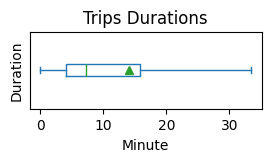

In [7]:
import numpy as np

duration_df = df[(df['duration'] < 10000)]['duration'].copy(deep=True)
duration_df = duration_df / 60
duration_df.plot(kind='box', xlabel='Minute', ylabel='Duration', showfliers=False, figsize=(3, 1), showmeans=True, yticks=[],
                 title='Trips Durations', vert=False)
duration_df.describe()

### Load the stations and their GPS location.

In [8]:
import json

stations = json.load(open('./stations-latlng.json'))
stations = {station: {'latlng': latlng} for station, latlng in stations.items()}
for name, station in stations.items():
    station['parked'] = df[(df['start_station_name'] == name) & (df['end_station_name'] != name)].shape[0]
    station['rented'] = df[(df['start_station_name'] != name) & (df['end_station_name'] == name)].shape[0]
    station['days_inuse'] = df[(df['start_station_name'] == name) | (df['end_station_name'] == name)]['start_date'].dt.date.nunique()

In [9]:
# find stations with inconsistent names
# for st in set(df['start_station_name'].unique()).union(set(df['end_station_name'].unique())):
#     if st not in stations:
#         print(f"station not found: {st}")

find the distance between two stations.

In [10]:
from geopy.distance import geodesic

routes = df[['start_station_name', 'end_station_name']].value_counts().reset_index()
routes['distance_miles'] = routes.apply(lambda x: geodesic(stations[x['start_station_name']]['latlng'], stations[x['end_station_name']]['latlng']).miles, axis=1)
routes.head(n=15)

,start_station_name,end_station_name,count,distance_miles
0,Boulevard of the Allies & Parkview Ave,S Bouquet Ave & Sennott St,14356,0.539364
1,S Bouquet Ave & Sennott St,Boulevard of the Allies & Parkview Ave,12514,0.539364
2,N Dithridge St & Centre Ave,O'Hara St and University Place,10198,0.477935
3,S Bouquet Ave & Sennott St,Atwood St & Bates St,9874,0.274320
4,Atwood St & Bates St,S Bouquet Ave & Sennott St,9870,0.274320
5,O'Hara St and University Place,N Dithridge St & Centre Ave,9012,0.477935
6,S Bouquet Ave & Sennott St,Zulema St & Coltart Ave,7661,0.389276
7,S 27th St & Sidney St. (Southside Works),S 27th St & Sidney St. (Southside Works),7131,0.000000
8,Forbes Ave & Schenley Dr,Boulevard of the Allies & Parkview Ave,7072,0.615921
9,Zulema St & Coltart Ave,S Bouquet Ave & Sennott St,6877,0.389276


count the number of rides for each station.

In [11]:
stations_rides_ct = routes.groupby(by='start_station_name')['count'].sum().to_dict()
for station, rides in routes.groupby(by='end_station_name')['count'].sum().to_dict().items():
    stations_rides_ct[station] = stations_rides_ct.get(station, 0) + rides
stations_rides_ct = pd.DataFrame(stations_rides_ct.items(), columns=['station', 'rides']).sort_values(by='rides', ascending=False)

### Top 10 busiest stations

In [12]:
stations_rides_ct.head(n=10)

,station,rides
51,S Bouquet Ave & Sennott St,118661
11,Boulevard of the Allies & Parkview Ave,92647
27,Forbes Ave & Schenley Dr,76421
39,O'Hara St and University Place,72060
36,N Dithridge St & Centre Ave,69156
9,Atwood St & Bates St,67092
66,Zulema St & Coltart Ave,57872
22,Fifth Ave & S Bouquet St,51420
50,S 27th St & Sidney St. (Southside Works),45042
17,Coltart Ave & Forbes Ave,41030


### Top 10 least busy stations

In [13]:
stations_rides_ct.tail(n=10)

,station,rides
55,Second Ave & Tecumseh St,911
19,Eliza St & Lytle St,859
35,N Braddock Ave & Hamilton Ave,651
37,N Homewood Ave & Finance St,603
34,N Braddock Ave & Frankstown Ave,396
21,Fifth Ave & N Bouquet St,303
24,Forbes & Market,42
3,33rd & Penn Ave,11
40,Parkview & Blvd of the Allies,3
56,Shady & Ellsworth,2


In [14]:
import folium
from branca.element import Figure

def plot_map(stations_list):
    pitt = folium.Map(location=[40.450142, -79.954803], 
                  zoom_start=13, zoom_control=False, 
                  tiles="Cartodb Positron")

    for _, (start, end, count, distance) in routes.iterrows():
        if start not in stations_list or end not in stations_list:
            continue
        
        folium.PolyLine(
            locations=[stations[start]['latlng'], stations[end]['latlng']],
            weight=max(0.01, count/1000),
            color='gray', opacity=1, 
            popup=folium.Popup(folium.Html(f"{int(count)} Rides<br/>From: {start}<br/>&nbsp;&nbsp;&nbsp;&nbsp;To: {end}", 
                                        script=True), 
                            max_width=300, min_width=300),
        ).add_to(pitt)

    for station, info in stations.items():
        if station not in stations_list:
            continue
        
        trips_ct_avg = (info['parked'] + info['rented']) / 2
        trips_ct_avg /= 5000 # scale down
        folium.CircleMarker(
            location=info['latlng'], radius=max(1, trips_ct_avg),
            stroke=False, fill_opacity=min(1, 0.5 + max(0, 1 - trips_ct_avg)), fill_color='black',
            popup=folium.Popup(folium.Html(f"{station}<br/>&nbsp;&nbsp;Rented: {int(info['rented'])}<br/>&nbsp;&nbsp;Parked: {int(info['parked'])}", 
                                        script=True), 
                            max_width=300, min_width=300),
        ).add_to(pitt)

    from branca.element import Template, MacroElement

    template = "{% macro html(this, kwargs) %}" + f"""
        <html>
        <body>
        <div style="position: absolute; z-index: 9999; right: 10px; bottom: 10px; width: 200px; background-color: white; padding: 5px 10px; border-radius: 5px;">
            <div>
                <span style="display: inline-block; width: 15px; text-align: center; vertical-align: middle;">
                    <span style="display: inline-block; width: 7.5px; height: 7.5px; border-radius: 100%; background-color: black;"></span>
                </span>
                <span style="vertical-align: middle;">Stations</span>
            </div>
            <div style="font-size: 12px;">diameter shows average rides at the station.</div>
            <div style="margin: 5px 0;"></div>
            <div>
                <span style="display: inline-block; width: 15px; text-align: center; vertical-align: middle;">
                    <span style="display: inline-block; color: gray;">━</span>
                </span>
                <span style="vertical-align: middle;">Rides</span>
            </div>
            <div style="font-size: 12px;">thickness shows total rides between stations.</div>
        </div>
        </body>
        </html>
    """ + "{% endmacro %}"

    macro = MacroElement()
    macro._template = Template(template)

    fig = Figure(width=960, height=720)
    fig.add_child(pitt)
    fig.add_child(macro)
    display(fig)
    
    return fig

### Plot the trips on the Pittsburgh map.

In [15]:
# 'POGOH Bike Rides (May 2022 - October 2024)'
stations_list = stations_rides_ct['station'].tolist()
plot_map(stations_list).save('pogoh-bike-rides.html')

ignore the top 10 stations, and plot the trips for the rest.

In [16]:
# 'POGOH Bike Rides (May 2022 - October 2024)'
stations_list = stations_rides_ct.tail(n=61)['station'].tolist()
plot_map(stations_list)

### Averaged Daily Bike Station Usage

/var/folders/wj/6ln4dhgx5dbgl4d41bhbdcyr0000gn/T/ipykernel_34963/3330368804.py:5: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  .plot(kind='line', y=['rented', 'parked'], stacked=True, figsize=(12, 3),


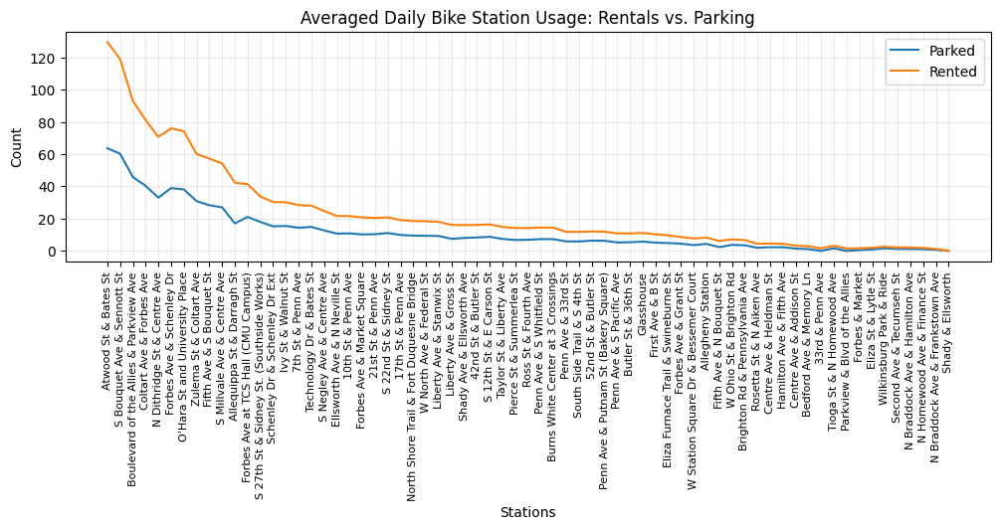

In [17]:
stations_df = pd.DataFrame(stations).transpose()
stations_df['rented'] = stations_df['rented'] / stations_df['days_inuse']
stations_df['parked'] = stations_df['parked'] / stations_df['days_inuse']
stations_inout_df = stations_df.sort_values('parked', ascending=False)\
    .plot(kind='line', y=['rented', 'parked'], stacked=True, figsize=(12, 3), 
          title='Averaged Daily Bike Station Usage: Rentals vs. Parking', 
          rot=90, xlabel='Stations', ylabel='Count',
          legend=True, xticks=range(len(stations_df)))
stations_inout_df.grid(alpha=0.25)
stations_inout_df.tick_params(axis='x', which='both', labelsize=8)
stations_inout_df.legend(['Parked', 'Rented'])

### Rides Volume by Month

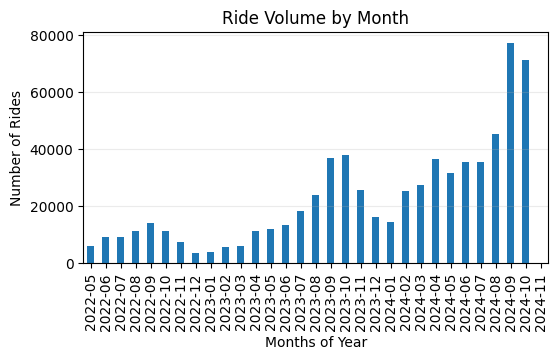

In [18]:
import matplotlib.pyplot as plt
from collections import Counter
months = [*df['start_date_ym'], *df['end_date_ym']]
counter = Counter(months)
counter = {key: value // 2 for key, value in counter.items()}
voltrend_byymonth_df = pd.DataFrame(counter.items(), columns=['Month', 'Rides']).sort_values('Month')\
    .plot(kind='bar', x='Month', y='Rides', figsize=(6, 3), 
          title='Ride Volume by Month', 
          xlabel='Months of Year', ylabel='Number of Rides', 
          legend=False)
voltrend_byymonth_df.grid(axis='y', alpha=0.25)

### Rides Volume by Hours of the Day

{23: 15599,
 22: 20802,
 21: 27476,
 20: 37812,
 19: 45478,
 18: 52422,
 17: 62129,
 16: 56341,
 15: 52891,
 14: 50027,
 13: 44263,
 12: 46730,
 11: 35643,
 10: 31410,
 9: 29341,
 8: 23821,
 7: 15652,
 6: 6588,
 5: 2217,
 3: 2232,
 2: 5069,
 1: 7946,
 0: 11192,
 4: 1243}

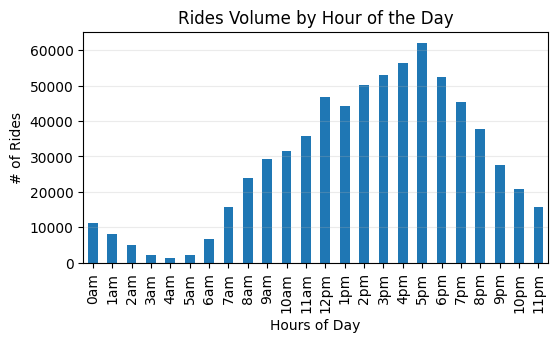

In [19]:
import matplotlib.pyplot as plt
from collections import Counter
hours = [*df['start_date'].dt.hour, *df['end_date'].dt.hour]
counter = Counter(hours)
counter = {key: value // 2 for key, value in counter.items()}
voltrend_bydhrs_df = pd.DataFrame(counter.items(), columns=['Hour', 'Rides']).sort_values('Hour')\
    .plot(kind='bar', x='Hour', y='Rides', figsize=(6, 3), 
          title='Rides Volume by Hour of the Day', xlabel='Hours of Day', ylabel='# of Rides', 
          legend=False)
plt.xticks([*range(0, 24)], ['0am', '1am', '2am', '3am', '4am', '5am', '6am', '7am', '8am', '9am', '10am', '11am', '12pm', '1pm', '2pm', '3pm', '4pm', '5pm', '6pm', '7pm', '8pm', '9pm', '10pm', '11pm'])
voltrend_bydhrs_df.grid(axis='y', alpha=0.25)
counter

In [20]:
daysofweek_trips_ct = df[['start_date_d', 'start_date_dw']].drop_duplicates().copy(deep=True)
daysofweek_trips_ct = daysofweek_trips_ct.groupby(by='start_date_dw').size().to_dict()
daysofweek_trips_ct

{0: 131, 1: 131, 2: 131, 3: 131, 4: 130, 5: 130, 6: 131}

{3: 105415, 2: 100741, 1: 99086, 0: 93177, 6: 88839, 5: 96343, 4: 100726}

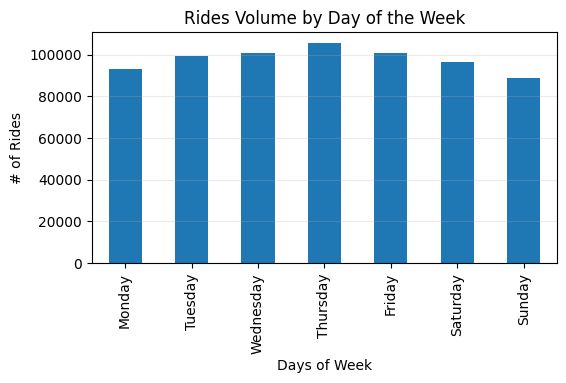

In [21]:
import matplotlib.pyplot as plt
from collections import Counter
daysofweek = [*df['start_date_dw'], *df['end_date_dw']]
counter = Counter(daysofweek)
counter = {key: value // 2 for key, value in counter.items()}
voltrend_bywdays_df = pd.DataFrame(counter.items(), columns=['Day', 'Rides']).sort_values('Day')\
    .plot(kind='bar', x='Day', y='Rides', figsize=(6, 3), 
          title='Rides Volume by Day of the Week', xlabel='Days of Week', ylabel='# of Rides', 
          legend=False)
plt.xticks([*range(0, 7)], ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
voltrend_bywdays_df.grid(axis='y', alpha=0.25)

# pd.DataFrame(counter.items(), columns=['Day', 'Rides'])['Rides'].describe()
counter

In [22]:
trips_per_daysofweek = {key: value / daysofweek_trips_ct[key] for key, value in counter.items()}
trips_per_daysofweek

{3: 804.6946564885496,
 2: 769.0152671755725,
 1: 756.3816793893129,
 0: 711.2748091603054,
 6: 678.1603053435115,
 5: 741.1,
 4: 774.8153846153846}

load the allegheny crash dataset

In [23]:
import os
import requests
import shutil

if not os.path.exists("./datasets"):
    os.makedirs("./datasets")

link = "https://data.wprdc.org/datastore/dump/2c13021f-74a9-4289-a1e5-fe0472c89881?bom=True"
filename = "pitt-crash-data.csv"
if os.path.exists(f"./datasets/{filename}"):
    print(f"alraedy exists: skipping {link}")
else:
    print(f"downloading {link}")
    response = requests.get(link, stream=True)
    with open(f"./datasets/{filename}", "wb") as out_file:
        shutil.copyfileobj(response.raw, out_file)
    del response

alraedy exists: skipping https://data.wprdc.org/datastore/dump/2c13021f-74a9-4289-a1e5-fe0472c89881?bom=True


In [24]:
crash_df = pd.read_csv(f"./datasets/pitt-crash-data.csv")
crash_df.shape

/var/folders/wj/6ln4dhgx5dbgl4d41bhbdcyr0000gn/T/ipykernel_34963/2504533871.py:1: DtypeWarning: Columns (20,21,74,78,79,80,81,82,83,84,85,184,190) have mixed types. Specify dtype option on import or set low_memory=False.
  crash_df = pd.read_csv(f"./datasets/pitt-crash-data.csv")


(238582, 191)

calculate the number of bicycle crashes and deaths

In [25]:
print('percentage of crashes that involved a bicycle:', crash_df['BICYCLE_COUNT'].mean() * 100)
print('number crashes that involved a bicycle:', crash_df['BICYCLE_COUNT'].sum())
display(crash_df[crash_df['BICYCLE_COUNT'] > 0]['BICYCLE_COUNT'].describe())
print('number of bicycle rider death:', crash_df['BICYCLE_DEATH_COUNT'].sum())
print('total number of crash death:', crash_df['FATAL_COUNT'].sum())

percentage of crashes that involved a bicycle: 0.6894904058143531
number crashes that involved a bicycle: 1645


count    1633.000000
mean        1.007348
std         0.104763
min         1.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         4.000000
Name: BICYCLE_COUNT, dtype: float64

number of bicycle rider death: 20
total number of crash death: 1405
